## Unsupervised Learning of Biomas data. 

--------------------------------
## **Context** 
-------------------------------

We study connection between carbon concentration in relation to the particle. We are trying to find 
dependancies and effect of various factos. Such as Temperature, wind, position, other products. 

Expectations: 
    min: the emerging clusters will correspond to the biomes as in Cabre et al 2016.
    max: by seeing how TK and ROY fall into different categories we might find the driving factors. 




----------------------------
## **Objective**
-----------------------------

Define driving factors

--------------------------
## **Data Description**
--------------------------
total carbon in the particles ranging from 0.5 to 50 um.
pico = 0.5-2 um, nano = 2-20 um, micro = 20-50 um
TK, ROY, Satellite data are downloaded for 2003-2007, resampled from 0.083(12 km) to 1 degree, using NN
Nitrate, Phosphate and silicate are from WOA

Winds and MLD are from EraInterim

- **Fe:** Iron from https://zenodo.org/record/6385044#.Y2hc-3bMKUk   Huang Y, Tagliabue A and Cassar N (2022)Data-driven modeling of dissolved iron in the global ocean.

- **TK_T:** Is calculated as in Kostadinov et al., 2016 
    All TK data is based on TK 2016, the LUTs were obtaing from Tiho in Feb 2020 before OS meeting in San Diego
- **ROY_T:** Total carbon calculated from size distributions (xi, k, particle numbers) provided by Shovonlal Sept 2019
    
    Both products use unified allometric coefficients described in Roy et al, 2013. 
- ** suffix _P, _N, _M:** denotes size group as noted above
    satellite gridded data: 
- **PAR:**  oceancolor SeaWiFS v 2020. 
- **PIC:**
- **Stram:**
- **Beh:** 
- **CHL:**
- **SST:**
- **MLD:** 
- **Wind, U10, V10, tccurl, lpcurl, vecurl:**, 
    
     PO4, Si, NO3, 
     
Coordinates:
- **Month_v:**  column shows the # of the month
- **Lon:**   Shows pixel number in a 1 degree coordinates, corresponds to Longitudes
- **Lat:**   Shows pixel number in a 1 degree coordinates, corresponds to Latitudes


In [5]:
# !pip install cartopy # Cartopy requires GEOS, Shapely and Pyshp
!pip install cartopy
# import matplotlib.basemap as bmp 
# import cartopy.crs as ccrs
# import cartopy.feature as cfeature

  error: subprocess-exited-with-error
  
  exit code: 1



  Using cached Cartopy-0.21.0.tar.gz (10.9 MB)
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'


  
  [286 lines of output]
  <string>:90: UserWarning: Unable to determine GEOS version. Ensure you have 3.7.2 or later installed, or installation may fail.
  running bdist_wheel
  running build
  running build_py
  creating build
  creating build\lib.win-amd64-cpython-310
  creating build\lib.win-amd64-cpython-310\cartopy
  copying lib\cartopy\crs.py -> build\lib.win-amd64-cpython-310\cartopy
  copying lib\cartopy\geodesic.py -> build\lib.win-amd64-cpython-310\cartopy
  copying lib\cartopy\img_transform.py -> build\lib.win-amd64-cpython-310\cartopy
  copying lib\cartopy\util.py -> build\lib.win-amd64-cpython-310\cartopy
  copying lib\cartopy\vector_transform.py -> build\lib.win-amd64-cpython-310\cartopy
  copying lib\cartopy\_epsg.py -> build\lib.win-amd64-cpython-310\cartopy
  copying lib\cartopy\_version.py -> build\lib.win-amd64-cpython-310\cartopy
  copying lib\cartopy\__init__.py -> build\lib.win-amd64-cpython-310\cartopy
  creating build\lib.win-amd64-cpython-310\cartopy\feature

Failed to build cartopy


In [12]:
# Libraries to help with reading and manipulating data
import numpy as np
import pandas as pd

# Libraries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_theme(style='darkgrid')

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)
# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 200)

# To scale the data using z-score
from sklearn.preprocessing import StandardScaler

# To compute distances
from scipy.spatial.distance import cdist, pdist

# To perform k-means clustering and compute silhouette scores
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# To import K-Medoids
from sklearn_extra.cluster import KMedoids

# To import DBSCAN and Gaussian Mixture
from sklearn.cluster import DBSCAN
from sklearn.mixture import GaussianMixture

# To perform hierarchical clustering, compute cophenetic correlation, and create dendrograms
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage, cophenet

# To suppress warnings
import warnings
warnings.filterwarnings("ignore")

In [13]:
data = pd.read_csv("biomas_plus_data.csv")

In [3]:
data.shape

(777600, 28)

In [14]:
data.sample(10, random_state = 1)

,TK_T,TK_P,TK_N,TK_M,ROY_T,ROY_P,ROY_N,ROY_M,PAR,MLD,SST,Wind,U10,V10,tccurl,lpcurl,vecurl,PIC,Stram,Beh,CHL,PO4,Si,NO3,Fe,Month_v,Lon,Lat
695395,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.719213,3.619291,1.166421,0.005796,0.007372,0.006446,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11,264,56
353761,25.718020,19.626603,5.535998,0.555418,6.911194,5.026356,1.725270,0.159569,57.922000,13.968292,20.875000,6.683783,-1.844477,-6.199364,-0.010298,-0.009192,-0.009086,0.000041,43.639905,7.591147,0.129890,0.180508,3.669530,0.297419,NaN,6,166,62
373180,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.714346,0.278717,-1.240721,0.000944,0.001101,0.000630,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6,274,41
3920,45.174547,22.645837,18.379959,4.148751,9.877013,6.792628,2.527981,0.556403,42.642799,33.827987,11.481000,10.118359,5.986490,-0.823461,0.009257,0.008192,0.008415,0.000203,64.199906,22.553235,0.205596,0.505600,0.667084,8.447805,0.102527,1,22,141
566700,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.500702,0.945864,1.572976,-0.002291,-0.002700,-0.002607,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9,269,61
234714,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.526561,-1.237014,-6.702178,0.003521,0.003048,0.003085,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,224,175
704819,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.510022,-0.717482,1.467713,-0.000576,-0.000190,0.000174,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11,316,120
183168,13.452861,10.053866,3.110673,0.288321,3.836545,1.536154,1.512020,0.788371,49.010399,16.032002,30.277999,4.739664,0.544027,1.427857,-0.001184,-0.001530,-0.001479,0.000081,35.919905,6.308688,0.113656,0.325016,2.905215,0.149388,NaN,3,298,109
110418,43.934749,18.048387,20.125317,5.761045,10.480438,7.215415,2.925824,0.339199,49.775599,12.121080,28.802999,3.472664,0.556280,-2.734024,0.001056,0.001167,0.000882,0.000029,60.279906,2.906945,0.208323,0.135116,2.021797,0.428711,NaN,2,254,79
768685,29.780342,13.533075,12.049663,4.197603,7.645597,6.176657,1.318071,0.150869,42.827999,17.866954,29.452999,4.498291,-1.175049,-1.331914,0.009331,0.008948,0.008122,0.000112,42.679905,9.888860,0.137888,0.102138,1.101885,0.264426,0.183262,12,311,86


Observations

The data has 777600 rows and 28 columns. 
The rows are consistent with 180 x 360 x 12 

In [16]:
# Copying the data to another variable to avoid any changes to original data
df = data.copy()

In [17]:
# Checking datatypes and number of non-null values for each column
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 777600 entries, 0 to 777599
Data columns (total 28 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   TK_T     387354 non-null  float64
 1   TK_P     387354 non-null  float64
 2   TK_N     387354 non-null  float64
 3   TK_M     387354 non-null  float64
 4   ROY_T    393727 non-null  float64
 5   ROY_P    393727 non-null  float64
 6   ROY_N    393727 non-null  float64
 7   ROY_M    393727 non-null  float64
 8   PAR      445163 non-null  float64
 9   MLD      565977 non-null  float64
 10  SST      446672 non-null  float64
 11  Wind     777600 non-null  float64
 12  U10      777600 non-null  float64
 13  V10      777600 non-null  float64
 14  tccurl   777600 non-null  float64
 15  lpcurl   777600 non-null  float64
 16  vecurl   777600 non-null  float64
 17  PIC      385870 non-null  float64
 18  Stram    394363 non-null  float64
 19  Beh      392826 non-null  float64
 20  CHL      389683 non-null  

In [7]:
# Checking for duplicate values
df.duplicated().sum()

0

In [8]:
# Checking for missing values
df.isnull().sum()

TK_T       390246
TK_P       390246
TK_N       390246
TK_M       390246
ROY_T      383873
ROY_P      383873
ROY_N      383873
ROY_M      383873
PAR        332437
MLD        211623
SST        330928
Wind            0
U10             0
V10             0
tccurl          0
lpcurl          0
vecurl          0
PIC        391730
Stram      383237
Beh        384774
CHL        387917
PO4        284544
Si         284544
NO3        284544
Fe         547586
Month_v         0
Lon             0
Lat             0
dtype: int64

TK data for each size group has the same missing values. 
ROY data also has the same nans in each size group
This comes from 1. available reflectancies (in the case of TK) or satellite absorption+chl data in case of ROY.
ROY has more data. 
ROY and TK products have about 50% of a full gridded product.
This is expected because wind or coordicate products do not have NaNs over continents and in the "dark" winter areas in respective hemispheres. 

The situation is similar for Behrenfeld, Stramski, Chlorophyll and PIC data that is derived from satellite data over the ocean. 

PAR, MLD and SST have mich better coverage, also showing missing values over the continents. 

Wind and wind curl parameters present a full stack, including data over continents. 

PO4, Si and NO3 are from World Ocean Atlas and cover the ocean except for continents

Month, Lon and Lat repesent coordicante and have no missing values. 
There are no duplicates 

All the other columns in the data are numeric in nature.
However, I want to change Months to categorical. 


In [18]:
# # replace months numbers  by categorical value 
# we cannot use it as is, but we can do dummies 
M_names = ["Jan","Feb","Mar","Apr","May","Jun","Jul","Aug","Sep","Oct","Nov","Dec"]
for i in range(1,13):
    mon = M_names[i-1]
    df.loc[ df['Month_v'] == i, 'Month_v'] = mon
df = pd.get_dummies(df)
    
df.tail()

,TK_T,TK_P,TK_N,TK_M,ROY_T,ROY_P,ROY_N,ROY_M,PAR,MLD,SST,Wind,U10,V10,tccurl,lpcurl,vecurl,PIC,Stram,Beh,CHL,PO4,Si,NO3,Fe,Lon,Lat,Month_v_Apr,Month_v_Aug,Month_v_Dec,Month_v_Feb,Month_v_Jan,Month_v_Jul,Month_v_Jun,Month_v_Mar,Month_v_May,Month_v_Nov,Month_v_Oct,Month_v_Sep
777595,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.408529,-0.995206,3.038263,-0.023532,-0.022993,-0.021771,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,360,176,0,0,1,0,0,0,0,0,0,0,0,0
777596,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.408453,-4.396589,5.597463,-0.028499,-0.026626,-0.025503,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,360,177,0,0,1,0,0,0,0,0,0,0,0,0
777597,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.162640,-4.716033,6.005491,0.006482,0.006263,0.005992,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,360,178,0,0,1,0,0,0,0,0,0,0,0,0
777598,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.248718,-3.072238,5.538443,0.029084,0.027484,0.026630,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,360,179,0,0,1,0,0,0,0,0,0,0,0,0
777599,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.020421,-0.399746,4.476674,0.032160,0.031667,0.029924,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,360,180,0,0,1,0,0,0,0,0,0,0,0,0


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 777600 entries, 0 to 777599
Data columns (total 39 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   TK_T         387354 non-null  float64
 1   TK_P         387354 non-null  float64
 2   TK_N         387354 non-null  float64
 3   TK_M         387354 non-null  float64
 4   ROY_T        393727 non-null  float64
 5   ROY_P        393727 non-null  float64
 6   ROY_N        393727 non-null  float64
 7   ROY_M        393727 non-null  float64
 8   PAR          445163 non-null  float64
 9   MLD          565977 non-null  float64
 10  SST          446672 non-null  float64
 11  Wind         777600 non-null  float64
 12  U10          777600 non-null  float64
 13  V10          777600 non-null  float64
 14  tccurl       777600 non-null  float64
 15  lpcurl       777600 non-null  float64
 16  vecurl       777600 non-null  float64
 17  PIC          385870 non-null  float64
 18  Stram        394363 non-

now we have 39 columns. 

## **Exploratory Data Analysis**

In [19]:
# over-the-land data makes no sense we drop the rows with NaNs. 
df  = df.dropna()
df.describe(include = 'all').T

,count,mean,std,min,25%,50%,75%,max
TK_T,175149.0,34.520799,27.023346,1.268497,15.066081,25.651349,45.565431,306.945841
TK_P,175149.0,15.764738,4.983314,1.129426,11.752596,15.723734,19.203279,75.994154
TK_N,175149.0,13.615125,14.745440,0.136317,2.792058,7.929962,19.806662,145.993675
TK_M,175149.0,5.140935,9.422413,0.000549,0.165328,1.116798,5.683216,138.798455
ROY_T,175149.0,8.119229,5.736294,0.629451,4.269599,7.001729,10.327945,355.029236
ROY_P,175149.0,4.713716,2.651279,0.001441,2.776875,4.322652,6.197514,229.764593
ROY_N,175149.0,2.503097,2.473087,0.103205,0.975529,1.703957,3.129607,63.472229
ROY_M,175149.0,0.902416,2.253007,0.004331,0.156901,0.390407,0.872934,283.720985
PAR,175149.0,36.380677,13.828458,4.282397,25.924398,38.951599,47.661199,63.344000
MLD,175149.0,38.486611,43.425434,10.035333,17.120384,26.814058,44.546933,2017.872656


**Observations:**

- without NaNs the data is way smaller.
- MLD has the biggerst range. 
- Stramski has very big values. very likely - outliers
- TK,  Stramski seem to be in the same range. 
- ROY and Behrenfeld are smaller (closer?)
- PIC and curls are tiny. The data will need standartization. 

Q: How am I going to make the test data? 

Univariate Analysis

In [20]:
# Function to plot a boxplot and a histogram along the same scale


def histogram_boxplot(data, feature, figsize = (8, 5), kde = False, bins = None):
    
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12, 7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows = 2,  # Number of rows of the subplot grid= 2
        sharex = True,  # X-axis will be shared among all subplots
        gridspec_kw = {"height_ratios": (0.25, 0.75)},
        figsize = figsize,
    )  # Creating the 2 subplots
    sns.boxplot(
        data = data, x = feature, ax = ax_box2, showmeans = True, color = "violet"
    )  # Boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data = data, x = feature, kde = kde, ax = ax_hist2, bins = bins, palette = "winter"
    ) if bins else sns.histplot(
        data = data, x = feature, kde = kde, ax = ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color = "green", linestyle = "--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color = "black", linestyle = "-"
    )  # Add median to the histogram

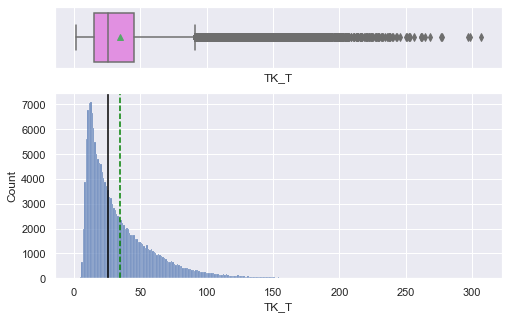

In [21]:
histogram_boxplot(df, 'TK_T')

In [ ]:
histogram_boxplot(df, 'ROY_T')

In [ ]:
histogram_boxplot(df, 'Beh')

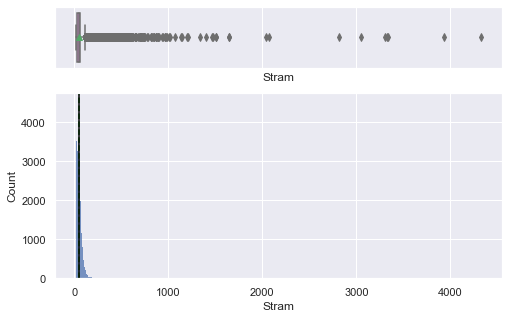

In [44]:
histogram_boxplot(df, 'Stram')

Here we see very clearly that Stramski data has very big outliers

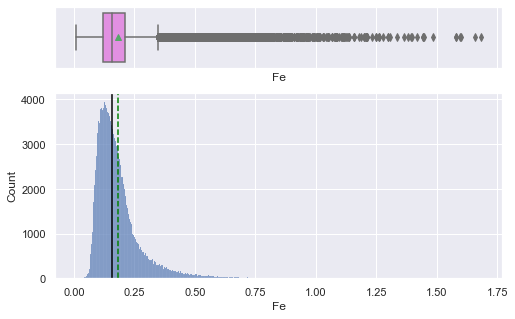

In [22]:
histogram_boxplot(df, 'Fe')

In [18]:
# # Function to create labeled barplots

# def labeled_barplot(data, feature, perc = False, n = None):
#     """
#     Barplot with percentage at the top

#     data: dataframe
#     feature: dataframe column
#     perc: whether to display percentages instead of count (default is False)
#     n: displays the top n category levels (default is None, i.e., display all levels)
#     """

#     total = len(data[feature])  # Length of the column
#     count = data[feature].nunique()
#     if n is None:
#         plt.figure(figsize = (count + 1, 5))
#     else:
#         plt.figure(figsize = (n + 1, 5))

#     plt.xticks(rotation = 90, fontsize = 15)
#     ax = sns.countplot(
#         data = data,
#         x = feature,
#         palette = "Paired",
#         order = data[feature].value_counts().index[:n].sort_values(),
#     )

#     for p in ax.patches:
#         if perc == True:
#             label = "{:.1f}%".format(
#                 100 * p.get_height() / total
#             )  # Percentage of each class of the category
#         else:
#             label = p.get_height()  # Count of each level of the category

#         x = p.get_x() + p.get_width() / 2  # Width of the plot
#         y = p.get_height()  # Height of the plot

#         ax.annotate(
#             label,
#             (x, y),
#             ha = "center",
#             va = "center",
#             size = 12,
#             xytext = (0, 5),
#             textcoords = "offset points",
#         )  # Annotate the percentage

#     plt.show()  # Show the plot

In [20]:
# labeled_barplot(df, 'Month_v')
# makes no sense after replacing months with dummies

KeyError: 'Month_v'

Bivariate Analysis

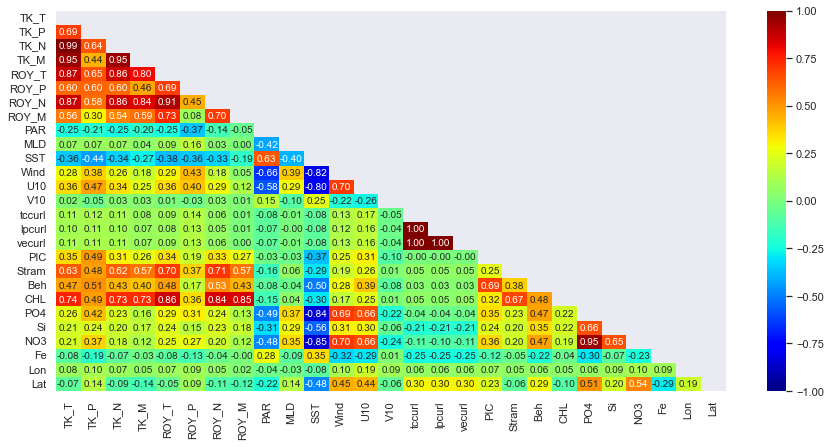

In [23]:
# Correlation check
cols_list = df.select_dtypes(include = np.number).columns.tolist()

plt.figure(figsize = (15, 7))
# Generate a mask for the upper triangle
corr = df[cols_list[:-12]].corr()
mask = np.triu(np.ones_like(corr, dtype=bool))

sns.heatmap(
    df[cols_list[:-12]].corr(),mask=mask, annot = True, vmin = -1, vmax = 1, fmt = ".2f", cmap = "jet"
)
# plt.savefig("corr_matrix_tr_12mon.png", facecolor='white')
plt.show()
# plt.savefig("corr_matrix_12mon.png")

**Observations: for seasonality  = average for wach month 12 months**

- biomass products are nicely correlated 
- Chl positive with biomass
- PIC is positive though smaller than biomass products
- PAR and SST are negative
- Iron is negative?? This is surprizing
- Latitude is also negative?? Also surprizing 

- Wind, esp U is positive with Lat, NO3, PO4 and even Si


KeyboardInterrupt: 

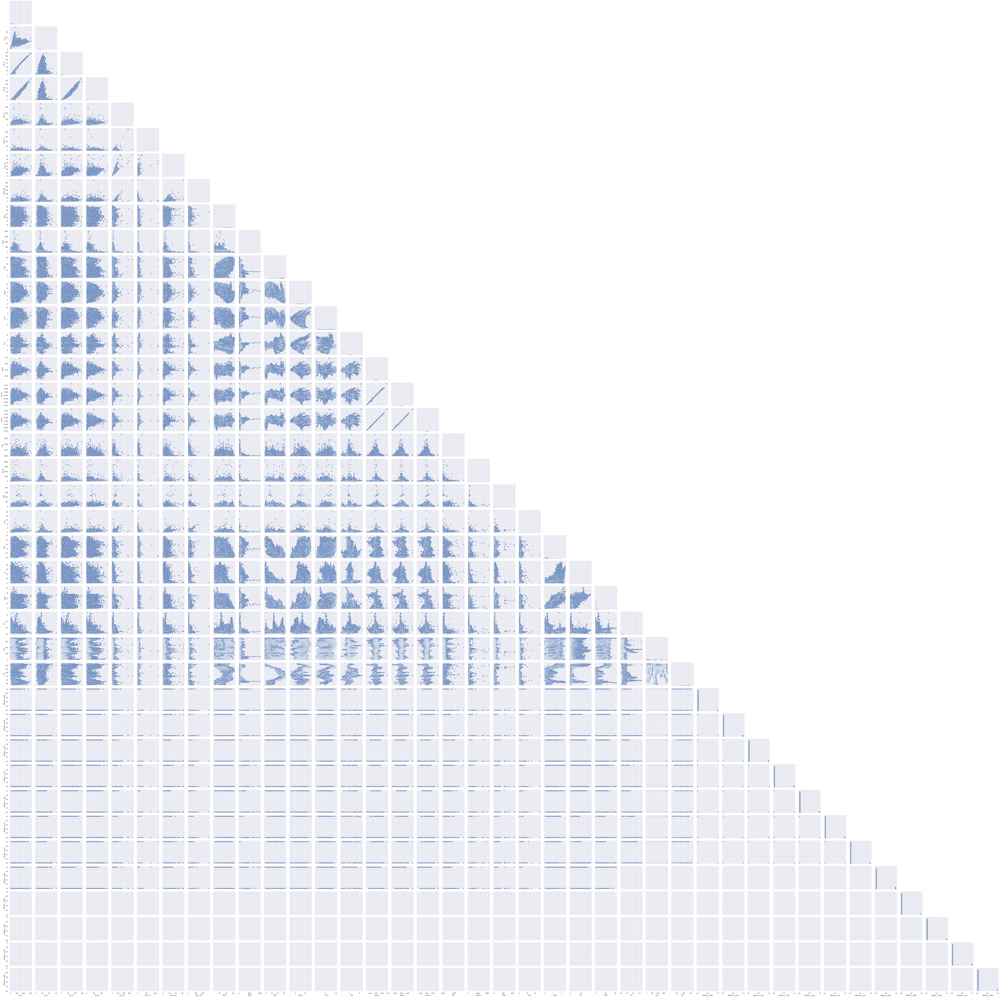

In [46]:
# taking forever. run at night

# sns.pairplot(df[cols_list[:-14]],  corner = True)
# plt.legend( fontsize=25)
# plt.savefig("corr_scatters_hue_12mon.png", facecolor = 'white')

# plt.show()

Outlier Check

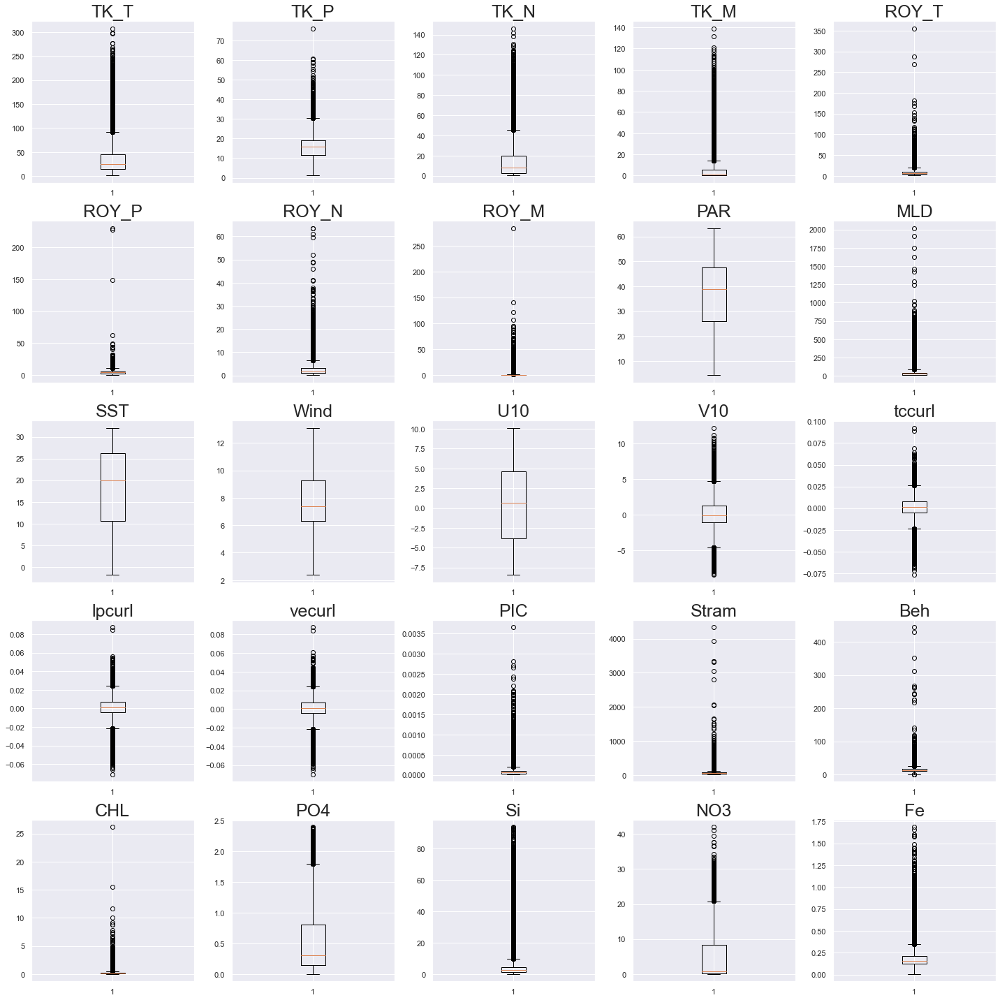

In [24]:
# ['TK_T', 'TK_P', 'TK_N', 'TK_M', 'ROY_T', 'ROY_P', 'ROY_N', 'ROY_M', 'PAR', 'MLD', 
#  'SST', 'Wind', 'U10', 'V10', 'tccurl', 'lpcurl', 'vecurl', 'PIC', 'Stram', 'Beh', 
#  'CHL', 'PO4', 'Si', 'NO3', 'Fe', 'Lon', 'Lat']

plt.figure(figsize = (20, 20))

# numeric_columns = df.select_dtypes(include = np.number).columns.tolist()

for i, variable in enumerate(cols_list[:-14]):
    
    plt.subplot(5, 5, i + 1)
    
    plt.boxplot(df[variable], whis = 1.5)
    
    plt.tight_layout()
    
    plt.title(variable, fontsize=25)

# plt.savefig("outliers_mon.png", facecolor = 'white')
plt.show()

The data is either very scewed, or there are too many outliers.
The ways of dealing: 
1. Drop remove some values. (maybe not rows) 
2. Log transform. Advantages: Accepted in the communuty and reduces the effect. 
                  Disadvantages: harder to analyse. Not always makes sence. 

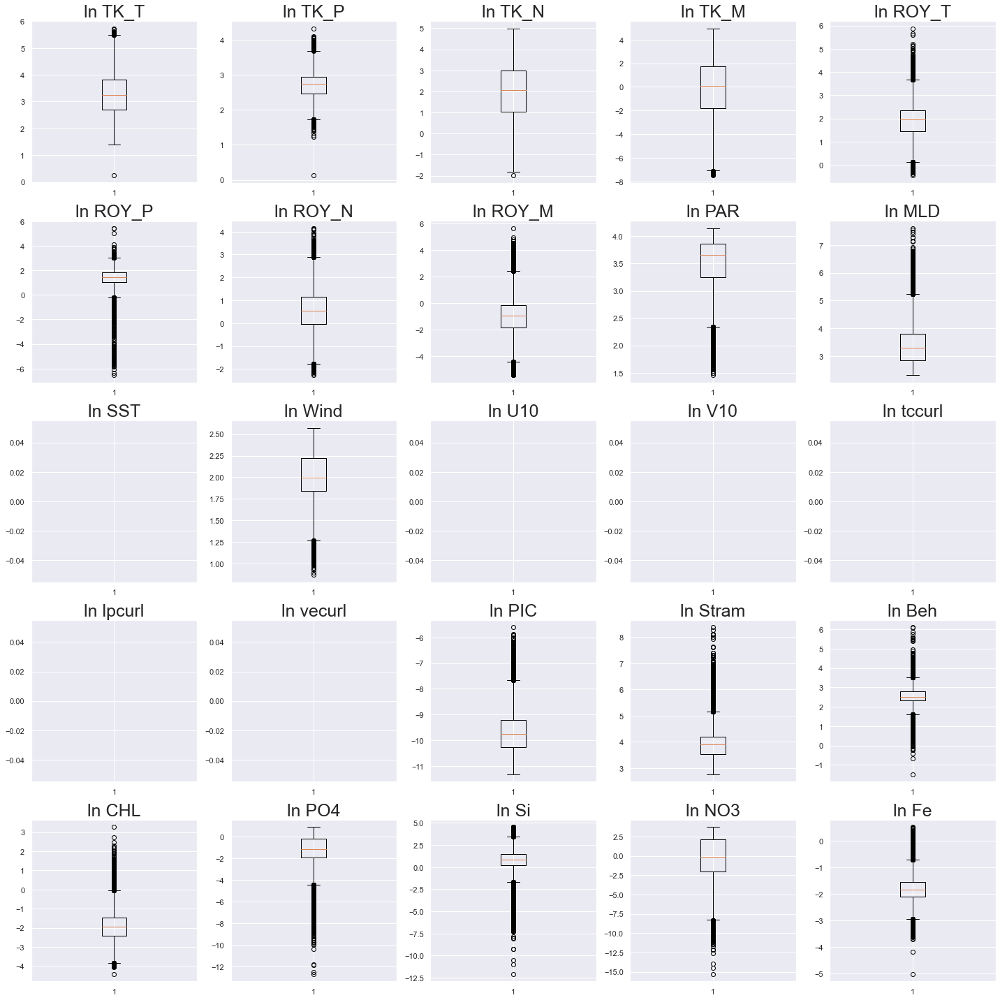

In [26]:
# lets take a look at the same plots with Log transform
plt.figure(figsize = (20, 20))

# numeric_columns = df.select_dtypes(include = np.number).columns.tolist()

for i, variable in enumerate(cols_list[:-14]):
    
    plt.subplot(5, 5, i + 1)
    
    plt.boxplot(np.log(df[variable]), whis = 1.5)
    
    plt.tight_layout()
    
    plt.title('ln ' + variable, fontsize=25)

# plt.savefig("log_outliers_mon.png", facecolor = 'white')
plt.show()

- **Tukey’s rule to detect outliers:**. It is also known as the IQR rule. First, we will calculate the Interquartile Range of the data (IQR = Q3 — Q1). Later, we will determine our outlier boundaries with IQR.
- **Winsorize Method:** the cut off boundaries are preset. normally we use 0.01 and 0.99.
- **Logtranform:**  Log transformation is commonly used for machine learning algorithms. Be careful, it changes our values but removes outliers. It makes our model normal and the machine learning algorithm likes normal distribution data. There are some methods and features in machine learning algorithms such as scaling and normalization. We will talk about these terms in our next stories.
Should **play with the log base** 10? e?

- Log10 and ln looks very similar.
- Doesn’t make sense for negative values
- I would stick to log10.  For biomass. Even MLD looks better in Log
- PIC, Stramki and Behrenfeld, looks like CHL,  SI,  Fe  


In [27]:
# print(cols_list[:-2])
cols_toLog = ['TK_T', 'TK_P', 'TK_N', 'TK_M', 'ROY_T', 'ROY_P', 'ROY_N', 'ROY_M', 'PAR', 'MLD', 
 'SST', 'PIC', 'Stram', 'Beh', 'CHL',  'Si', 'Fe']
for col in cols_toLog:
    df[col] = np.log10(df[col])
    
df.tail()

,TK_T,TK_P,TK_N,TK_M,ROY_T,ROY_P,ROY_N,ROY_M,PAR,MLD,SST,Wind,U10,V10,tccurl,lpcurl,vecurl,PIC,Stram,Beh,CHL,PO4,Si,NO3,Fe,Lon,Lat,Month_v_Apr,Month_v_Aug,Month_v_Dec,Month_v_Feb,Month_v_Jan,Month_v_Jul,Month_v_Jun,Month_v_Mar,Month_v_May,Month_v_Nov,Month_v_Oct,Month_v_Sep
777207,1.695298,1.406186,1.290747,0.659700,1.102556,0.862907,0.588438,0.174371,1.616963,1.786941,0.737272,10.329552,6.668796,-1.070568,-0.003196,-0.002585,-0.002903,-3.621148,1.848804,1.394722,-0.568767,1.475125,0.352335,18.751274,-1.034882,358,148,0,0,1,0,0,0,0,0,0,0,0,0
777208,1.655200,1.342742,1.273141,0.646813,1.053799,0.707382,0.698105,0.090232,1.580455,1.788902,0.692406,10.181751,6.489662,-1.008405,-0.005494,-0.004530,-0.004982,-3.680894,1.886265,1.503999,-0.472905,1.508425,0.065045,20.088223,-0.979444,358,149,0,0,1,0,0,0,0,0,0,0,0,0
777209,1.737793,1.404139,1.374281,0.751399,1.060784,0.626727,0.708889,0.333044,1.553878,1.743520,0.651956,9.969731,6.096816,-0.895908,-0.009156,-0.008741,-0.008289,-3.684030,1.921582,1.483512,-0.456509,1.528112,-0.187457,21.499632,-0.959848,358,150,0,0,1,0,0,0,0,0,0,0,0,0
777210,1.816241,1.413655,1.471387,0.998793,1.164669,0.753689,0.809462,0.396325,1.542855,1.691648,0.444357,9.827471,5.687960,-0.712460,-0.010713,-0.010935,-0.009668,-3.575527,1.973589,1.549925,-0.405542,1.543285,0.155725,22.741966,-0.888044,358,151,0,0,1,0,0,0,0,0,0,0,0,0
777212,1.496793,1.321357,0.974036,0.005220,0.982228,0.716115,0.534532,-0.011566,1.512615,1.577302,0.168055,9.153585,4.639926,-0.704560,-0.013483,-0.011462,-0.012134,-3.628009,1.841359,1.539326,-0.646011,1.560804,1.101914,24.562937,-0.859016,358,153,0,0,1,0,0,0,0,0,0,0,0,0


In [28]:
# Copying the data to another variable to avoid any changes to already preprocessed data
df_clean = df.copy()

In [30]:
# Remove outliers that are way too far/big/small

for ccol in cols_list[:-14]:
    max_cond = df_clean[ccol].quantile(0.99)
    min_cond = df_clean[ccol].quantile(0.01)
# print(max_cond)
    df_clean.loc[df_clean[ccol] > max_cond, ccol] = np.nan
    df_clean.loc[df_clean[ccol] < min_cond, ccol] = np.nan 
df_clean.dropna()    
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 175149 entries, 219 to 777212
Data columns (total 39 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   TK_T         168211 non-null  float64
 1   TK_P         168211 non-null  float64
 2   TK_N         168211 non-null  float64
 3   TK_M         168211 non-null  float64
 4   ROY_T        168211 non-null  float64
 5   ROY_P        168211 non-null  float64
 6   ROY_N        168211 non-null  float64
 7   ROY_M        168211 non-null  float64
 8   PAR          168212 non-null  float64
 9   MLD          168211 non-null  float64
 10  SST          165942 non-null  float64
 11  Wind         168211 non-null  float64
 12  U10          168211 non-null  float64
 13  V10          168211 non-null  float64
 14  tccurl       168211 non-null  float64
 15  lpcurl       168211 non-null  float64
 16  vecurl       168211 non-null  float64
 17  PIC          171463 non-null  float64
 18  Stram        168236 no

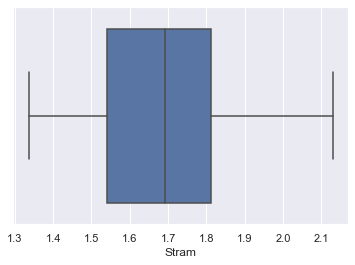

In [31]:

sns.boxplot(df_clean['Stram'])
# plt.plot(df_clean['Stram'])
plt.show()

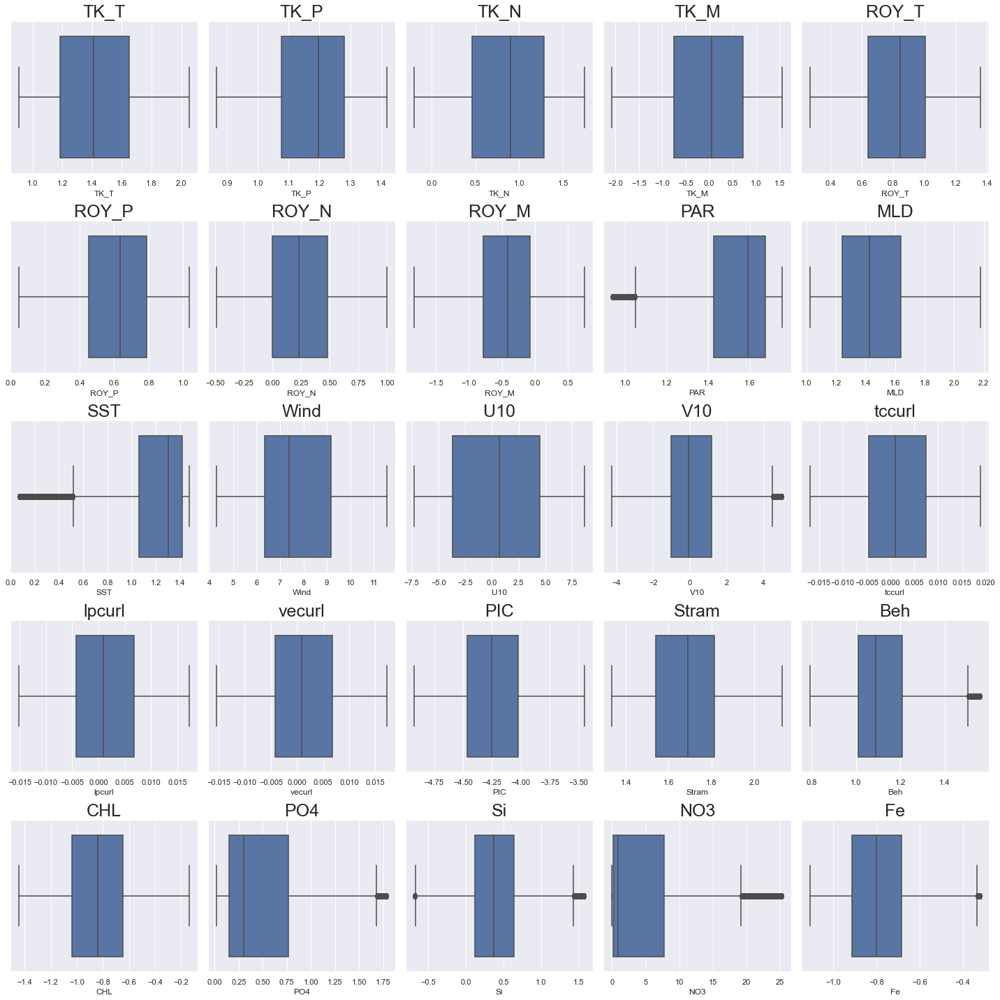

In [32]:
plt.figure(figsize = (20, 20))

# numeric_columns = df.select_dtypes(include = np.number).columns.tolist()

for i, variable in enumerate(cols_list[:-14]):
    
    plt.subplot(5, 5, i + 1)
    
    sns.boxplot(df_clean[variable], whis = 1.5)
    
    plt.tight_layout()
    
    plt.title(variable, fontsize=25)
# 
plt.savefig("biomas_log10_distrib.png", facecolor = 'white')
plt.show()

In [33]:
# make sure there are no NaNs for PCA. However, ther eare methods that aren't sensitive to this

df_PCA = df_clean.dropna(axis='rows', how = 'any')
df_PCA.info()
df_PCA.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 99725 entries, 225 to 777212
Data columns (total 39 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   TK_T         99725 non-null  float64
 1   TK_P         99725 non-null  float64
 2   TK_N         99725 non-null  float64
 3   TK_M         99725 non-null  float64
 4   ROY_T        99725 non-null  float64
 5   ROY_P        99725 non-null  float64
 6   ROY_N        99725 non-null  float64
 7   ROY_M        99725 non-null  float64
 8   PAR          99725 non-null  float64
 9   MLD          99725 non-null  float64
 10  SST          99725 non-null  float64
 11  Wind         99725 non-null  float64
 12  U10          99725 non-null  float64
 13  V10          99725 non-null  float64
 14  tccurl       99725 non-null  float64
 15  lpcurl       99725 non-null  float64
 16  vecurl       99725 non-null  float64
 17  PIC          99725 non-null  float64
 18  Stram        99725 non-null  float64
 19  B

,TK_T,TK_P,TK_N,TK_M,ROY_T,ROY_P,ROY_N,ROY_M,PAR,MLD,SST,Wind,U10,V10,tccurl,lpcurl,vecurl,PIC,Stram,Beh,CHL,PO4,Si,NO3,Fe,Lon,Lat,Month_v_Apr,Month_v_Aug,Month_v_Dec,Month_v_Feb,Month_v_Jan,Month_v_Jul,Month_v_Jun,Month_v_Mar,Month_v_May,Month_v_Nov,Month_v_Oct,Month_v_Sep
225,1.708600,1.118688,1.399838,1.109536,1.142152,0.914113,0.685439,-0.086106,0.968912,1.283374,0.799616,11.275903,4.706937,0.318891,0.015146,0.014050,0.013959,-4.838632,1.942999,1.036154,-0.471036,1.323958,1.264313,11.444828,-0.912201,2,46,0,0,0,0,1,0,0,0,0,0,0,0
226,1.777858,1.211736,1.479350,1.131043,1.176018,1.031504,0.555949,-0.188393,1.014571,1.323847,0.841422,11.526707,5.436304,0.346983,0.013539,0.012664,0.012571,-4.725852,1.900257,1.000478,-0.519590,1.153387,1.232119,9.997232,-0.924594,2,47,0,0,0,0,1,0,0,0,0,0,0,0
285,1.703755,1.133409,1.360488,1.146860,0.514426,0.412716,-0.277232,-0.811344,1.682019,1.283719,1.472230,5.724634,-3.506938,0.886475,-0.006151,-0.005775,-0.005288,-3.634513,1.485720,1.064708,-1.221975,0.224104,0.356020,0.391093,-0.719048,2,106,0,0,0,0,1,0,0,0,0,0,0,0
286,1.440334,1.167723,1.011260,0.412809,0.475667,0.224148,-0.092177,-0.296115,1.700821,1.274203,1.465219,5.961529,-3.968511,1.177341,-0.004456,-0.004511,-0.004138,-3.794256,1.500235,1.152919,-1.173917,0.233343,0.321000,0.385426,-0.701927,2,107,0,0,0,0,1,0,0,0,0,0,0,0
287,1.218866,1.086106,0.603581,-0.461312,0.525353,0.250510,0.104051,-0.521026,1.719755,1.262355,1.456412,6.075997,-4.286039,1.346720,-0.001567,-0.001591,-0.001483,-4.178273,1.502426,1.147978,-1.091213,0.231516,0.293866,0.401094,-0.681359,2,108,0,0,0,0,1,0,0,0,0,0,0,0


the data looks more "normal'

**DROP Lat and Lon**

**Scaling**
Let's scale the data before we proceed with clustering.

In [79]:
# Scaling the data before clustering

# cols_list = df_clean.select_dtypes(include = np.number).columns.tolist()
scaler = StandardScaler()
subset = df_PCA[cols_list].copy()
subset = subset.drop(['Lat', 'Lon'], axis=1)
subset_scaled = scaler.fit_transform(subset)
subset.head()

,TK_T,TK_P,TK_N,TK_M,ROY_T,ROY_P,ROY_N,ROY_M,PAR,MLD,SST,Wind,U10,V10,tccurl,lpcurl,vecurl,PIC,Stram,Beh,CHL,PO4,Si,NO3,Fe,Month_v_Apr,Month_v_Aug,Month_v_Dec,Month_v_Feb,Month_v_Jan,Month_v_Jul,Month_v_Jun,Month_v_Mar,Month_v_May,Month_v_Nov,Month_v_Oct,Month_v_Sep
225,1.708600,1.118688,1.399838,1.109536,1.142152,0.914113,0.685439,-0.086106,0.968912,1.283374,0.799616,11.275903,4.706937,0.318891,0.015146,0.014050,0.013959,-4.838632,1.942999,1.036154,-0.471036,1.323958,1.264313,11.444828,-0.912201,0,0,0,0,1,0,0,0,0,0,0,0
226,1.777858,1.211736,1.479350,1.131043,1.176018,1.031504,0.555949,-0.188393,1.014571,1.323847,0.841422,11.526707,5.436304,0.346983,0.013539,0.012664,0.012571,-4.725852,1.900257,1.000478,-0.519590,1.153387,1.232119,9.997232,-0.924594,0,0,0,0,1,0,0,0,0,0,0,0
285,1.703755,1.133409,1.360488,1.146860,0.514426,0.412716,-0.277232,-0.811344,1.682019,1.283719,1.472230,5.724634,-3.506938,0.886475,-0.006151,-0.005775,-0.005288,-3.634513,1.485720,1.064708,-1.221975,0.224104,0.356020,0.391093,-0.719048,0,0,0,0,1,0,0,0,0,0,0,0
286,1.440334,1.167723,1.011260,0.412809,0.475667,0.224148,-0.092177,-0.296115,1.700821,1.274203,1.465219,5.961529,-3.968511,1.177341,-0.004456,-0.004511,-0.004138,-3.794256,1.500235,1.152919,-1.173917,0.233343,0.321000,0.385426,-0.701927,0,0,0,0,1,0,0,0,0,0,0,0
287,1.218866,1.086106,0.603581,-0.461312,0.525353,0.250510,0.104051,-0.521026,1.719755,1.262355,1.456412,6.075997,-4.286039,1.346720,-0.001567,-0.001591,-0.001483,-4.178273,1.502426,1.147978,-1.091213,0.231516,0.293866,0.401094,-0.681359,0,0,0,0,1,0,0,0,0,0,0,0


In [80]:
# Creating a dataframe of the scaled data
subset_scaled_df = pd.DataFrame(subset_scaled, columns = subset.columns)

**DEFINE THE NUMBER OF PCA COMPONENTS**

**Applying PCA to the full dataset**

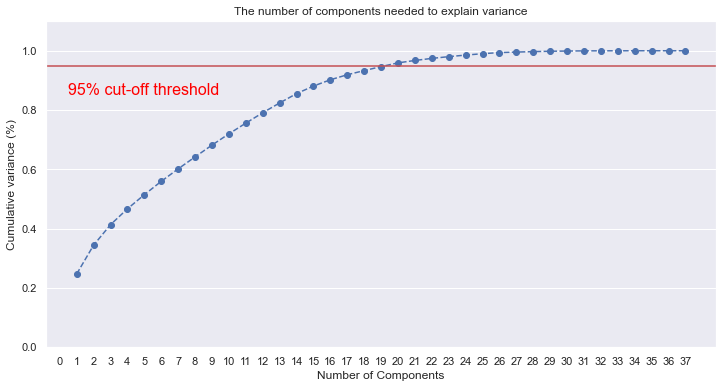

In [40]:
# Importing PCA (run this cell if needs be AFTER the next)

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
data_rescaled = scaler.fit_transform(subset)

pca = PCA().fit(data_rescaled)

# plot the %of variance captured in PCA components
plt.rcParams["figure.figsize"] = (12,6)

fig, ax = plt.subplots()
xi = np.arange(1, 38, step=1)
y = np.cumsum(pca.explained_variance_ratio_)

plt.ylim(0.0,1.1)
plt.plot(xi, y, marker='o', linestyle='--', color='b')

plt.xlabel('Number of Components')
plt.xticks(np.arange(0, 38, step=1)) #change from 0-based array index to 1-based human-readable label
plt.ylabel('Cumulative variance (%)')
plt.title('The number of components needed to explain variance')

plt.axhline(y=0.95, color='r', linestyle='-')
plt.text(0.5, 0.85, '95% cut-off threshold', color = 'red', fontsize=16)

ax.grid(axis='x')
plt.show()

**from this plot we need 18 components to reach 95% data variability description**

In [38]:
# Importing PCA
from sklearn.decomposition import PCA

# Defining the number of principal components to generate
# n = subset.shape[1]                # Storing the number of variables in the data(all features as components)
n =18 # see above PCA

pca = PCA(n_components = n, random_state = 1)                       # Storing PCA function with n components

data_pca = pd.DataFrame(pca.fit_transform(subset_scaled_df))          # Applying PCA on scaled data

# The percentage of variance explained by each principal component is stored
exp_var = (pca.explained_variance_ratio_)  

**K-Means Clustering**

In [83]:
k_means_df = data_pca.copy()  # always copy :)))))

Number of Clusters: 1 	Average Distortion: 5.760747141041054
Number of Clusters: 2 	Average Distortion: 5.0691089246854935
Number of Clusters: 3 	Average Distortion: 4.837642254881855
Number of Clusters: 4 	Average Distortion: 4.673801416032659
Number of Clusters: 5 	Average Distortion: 4.570371501247115
Number of Clusters: 6 	Average Distortion: 4.488971734811955
Number of Clusters: 7 	Average Distortion: 4.4164937533183455
Number of Clusters: 8 	Average Distortion: 4.352778947138866
Number of Clusters: 9 	Average Distortion: 4.296838844698382
Number of Clusters: 10 	Average Distortion: 4.225707988259898
Number of Clusters: 11 	Average Distortion: 4.161900726346935
Number of Clusters: 12 	Average Distortion: 4.122267460086337
Number of Clusters: 13 	Average Distortion: 4.079112269693114
Number of Clusters: 14 	Average Distortion: 4.006510158709036


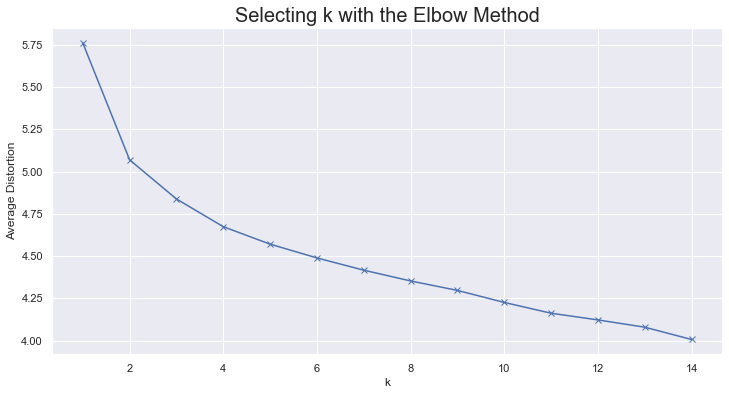

In [84]:
clusters = range(1, 15)
meanDistortions = []

for k in clusters:
    model = KMeans(n_clusters = k, random_state = 1)
    model.fit(data_pca)
    prediction = model.predict(k_means_df)
    distortion = (
        sum(np.min(cdist(k_means_df, model.cluster_centers_, "euclidean"), axis = 1))
        / k_means_df.shape[0]
    )

    meanDistortions.append(distortion)

    print("Number of Clusters:", k, "\tAverage Distortion:", distortion)

plt.plot(clusters, meanDistortions, "bx-")
plt.xlabel("k")
plt.ylabel("Average Distortion")
plt.title("Selecting k with the Elbow Method", fontsize = 20)
# plt.savefig("kMeans_elbow_nocoords.png", facecolor = 'white')
plt.show()

In [43]:
k_means_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99725 entries, 0 to 99724
Data columns (total 18 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       99725 non-null  float64
 1   1       99725 non-null  float64
 2   2       99725 non-null  float64
 3   3       99725 non-null  float64
 4   4       99725 non-null  float64
 5   5       99725 non-null  float64
 6   6       99725 non-null  float64
 7   7       99725 non-null  float64
 8   8       99725 non-null  float64
 9   9       99725 non-null  float64
 10  10      99725 non-null  float64
 11  11      99725 non-null  float64
 12  12      99725 non-null  float64
 13  13      99725 non-null  float64
 14  14      99725 non-null  float64
 15  15      99725 non-null  float64
 16  16      99725 non-null  float64
 17  17      99725 non-null  float64
dtypes: float64(18)
memory usage: 13.7 MB


**Observations:**

- there is no obvious flatenning of the graph, meaning if there are optimal number of clusters - it is not obvious. The **k-means method doesn't seem to produce any reasonable elbow**. 
Could be due to preprocessing
Could be due to the wrong choice of the method. 

**I will move ahead with k = 7 (Expected to biomes)**. Anna has 13! We play with them later

**Obvious next steps:**
- get rid of well correlated variables (TK vs ROY) and see how biomes break. similar? different? 
- eliminte features one by one and see what happens
- change numbe rof biomes (k-means) 

In [44]:
kmeans = KMeans(n_clusters = 13, random_state = 1)
kmeans.fit(k_means_df)

KMeans(n_clusters=13, random_state=1)

In [85]:
# Creating a copy of the original data
df1 = df_PCA.copy()
# Adding K-Means cluster labels to the KMeans and original dataframes
k_means_df["Biomes"] = kmeans.labels_
df1["Biomes"] = kmeans.labels_
df1.head()

,TK_T,TK_P,TK_N,TK_M,ROY_T,ROY_P,ROY_N,ROY_M,PAR,MLD,SST,Wind,U10,V10,tccurl,lpcurl,vecurl,PIC,Stram,Beh,CHL,PO4,Si,NO3,Fe,Lon,Lat,Month_v_Apr,Month_v_Aug,Month_v_Dec,Month_v_Feb,Month_v_Jan,Month_v_Jul,Month_v_Jun,Month_v_Mar,Month_v_May,Month_v_Nov,Month_v_Oct,Month_v_Sep,Biomes
225,1.708600,1.118688,1.399838,1.109536,1.142152,0.914113,0.685439,-0.086106,0.968912,1.283374,0.799616,11.275903,4.706937,0.318891,0.015146,0.014050,0.013959,-4.838632,1.942999,1.036154,-0.471036,1.323958,1.264313,11.444828,-0.912201,2,46,0,0,0,0,1,0,0,0,0,0,0,0,9
226,1.777858,1.211736,1.479350,1.131043,1.176018,1.031504,0.555949,-0.188393,1.014571,1.323847,0.841422,11.526707,5.436304,0.346983,0.013539,0.012664,0.012571,-4.725852,1.900257,1.000478,-0.519590,1.153387,1.232119,9.997232,-0.924594,2,47,0,0,0,0,1,0,0,0,0,0,0,0,9
285,1.703755,1.133409,1.360488,1.146860,0.514426,0.412716,-0.277232,-0.811344,1.682019,1.283719,1.472230,5.724634,-3.506938,0.886475,-0.006151,-0.005775,-0.005288,-3.634513,1.485720,1.064708,-1.221975,0.224104,0.356020,0.391093,-0.719048,2,106,0,0,0,0,1,0,0,0,0,0,0,0,1
286,1.440334,1.167723,1.011260,0.412809,0.475667,0.224148,-0.092177,-0.296115,1.700821,1.274203,1.465219,5.961529,-3.968511,1.177341,-0.004456,-0.004511,-0.004138,-3.794256,1.500235,1.152919,-1.173917,0.233343,0.321000,0.385426,-0.701927,2,107,0,0,0,0,1,0,0,0,0,0,0,0,1
287,1.218866,1.086106,0.603581,-0.461312,0.525353,0.250510,0.104051,-0.521026,1.719755,1.262355,1.456412,6.075997,-4.286039,1.346720,-0.001567,-0.001591,-0.001483,-4.178273,1.502426,1.147978,-1.091213,0.231516,0.293866,0.401094,-0.681359,2,108,0,0,0,0,1,0,0,0,0,0,0,0,8


### Cluster Profiles`

In [46]:
km_cluster_profile = round(df1.groupby("Biomes").mean(),3)

In [47]:
# Creating the "count_in_each_segment" feature in K-Means cluster profile

km_cluster_profile["count_in_each_segment"] = (
    df1.groupby("Biomes")["Stram"].count().values
)

In [48]:
km_cluster_profile.style.highlight_max(color = "lightgreen", axis = 0)

,TK_T,TK_P,TK_N,TK_M,ROY_T,ROY_P,ROY_N,ROY_M,PAR,MLD,SST,Wind,U10,V10,tccurl,lpcurl,vecurl,PIC,Stram,Beh,CHL,PO4,Si,NO3,Fe,Lon,Lat,Month_v_Apr,Month_v_Aug,Month_v_Dec,Month_v_Feb,Month_v_Jan,Month_v_Jul,Month_v_Jun,Month_v_Mar,Month_v_May,Month_v_Nov,Month_v_Oct,Month_v_Sep,count_in_each_segment
Biomes,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,1.438000,1.222000,0.913000,0.041000,0.877000,0.724000,0.217000,-0.600000,1.269000,1.709000,0.716000,10.622000,6.823000,-1.196000,0.002000,0.002000,0.002000,-4.139000,1.711000,1.161000,-0.823000,1.331000,0.748000,17.890000,-0.845000,152.555000,141.684000,0.127000,0.087000,0.000000,0.000000,0.000000,0.001000,0.002000,0.320000,0.010000,0.003000,0.257000,0.193000,7438
1,1.424000,1.199000,0.935000,0.117000,0.842000,0.656000,0.253000,-0.464000,1.652000,1.324000,1.413000,6.258000,-3.227000,0.744000,-0.002000,-0.002000,-0.001000,-4.342000,1.682000,1.034000,-0.838000,0.285000,0.315000,1.336000,-0.746000,133.042000,88.628000,0.105000,0.001000,0.000000,0.132000,0.120000,0.000000,0.156000,0.139000,0.002000,0.000000,0.186000,0.159000,12058
2,1.271000,1.118000,0.626000,-0.450000,0.713000,0.528000,0.112000,-0.553000,1.620000,1.365000,1.360000,6.663000,-2.295000,0.204000,0.001000,0.001000,0.001000,-4.317000,1.600000,1.062000,-0.961000,0.296000,0.238000,1.839000,-0.834000,132.834000,95.911000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4382
3,1.268000,1.119000,0.627000,-0.447000,0.711000,0.550000,0.079000,-0.705000,1.581000,1.397000,1.354000,6.723000,-2.267000,0.945000,0.001000,0.001000,0.001000,-4.341000,1.584000,1.018000,-0.988000,0.255000,0.221000,1.081000,-0.803000,123.813000,94.051000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4898
4,1.731000,1.331000,1.361000,0.834000,1.065000,0.770000,0.604000,0.013000,1.590000,1.371000,1.082000,8.800000,4.813000,-0.514000,0.011000,0.009000,0.010000,-3.871000,1.878000,1.321000,-0.547000,0.683000,0.379000,6.858000,-0.834000,194.094000,128.407000,0.008000,0.003000,0.155000,0.140000,0.156000,0.004000,0.014000,0.163000,0.011000,0.170000,0.156000,0.020000,10310
5,1.438000,1.250000,0.856000,-0.092000,0.892000,0.675000,0.329000,-0.356000,1.544000,1.550000,0.690000,10.245000,6.901000,-1.304000,-0.002000,-0.002000,-0.002000,-3.805000,1.763000,1.344000,-0.766000,1.352000,0.663000,19.112000,-0.845000,175.815000,144.221000,0.001000,0.000000,0.157000,0.316000,0.286000,0.000000,0.000000,0.013000,0.000000,0.221000,0.005000,0.000000,5666
6,1.199000,1.089000,0.471000,-0.743000,0.676000,0.514000,0.046000,-0.709000,1.530000,1.441000,1.262000,7.348000,0.287000,0.520000,0.010000,0.009000,0.009000,-4.285000,1.568000,1.064000,-1.020000,0.316000,0.217000,2.252000,-0.848000,125.952000,121.519000,0.127000,0.000000,0.000000,0.107000,0.127000,0.000000,0.193000,0.135000,0.000000,0.000000,0.125000,0.186000,8352
7,1.759000,1.273000,1.428000,1.006000,1.083000,0.775000,0.632000,0.094000,1.478000,1.433000,1.234000,7.747000,1.058000,1.148000,-0.006000,-0.005000,-0.005000,-4.329000,1.891000,1.103000,-0.516000,0.366000,0.452000,2.537000,-0.757000,141.738000,65.366000,0.108000,0.067000,0.071000,0.102000,0.075000,0.047000,0.066000,0.099000,0.090000,0.085000,0.103000,0.086000,8922
8,1.095000,1.013000,0.270000,-1.099000,0.523000,0.371000,-0.138000,-0.872000,1.643000,1.397000,1.398000,6.481000,-3.758000,0.396000,-0.002000,-0.002000,-0.002000,-4.321000,1.463000,1.025000,-1.179000,0.142000,0.180000,0.206000,-0.673000,149.884000,91.385000,0.165000,0.006000,0.001000,0.159000,0.117000,0.007000,0.095000,0.188000,0.002000,0.005000,0.144000,0.113000,13378


How to add coordinates back?
Shall we imply the biomes?  - yes  for supervised learning

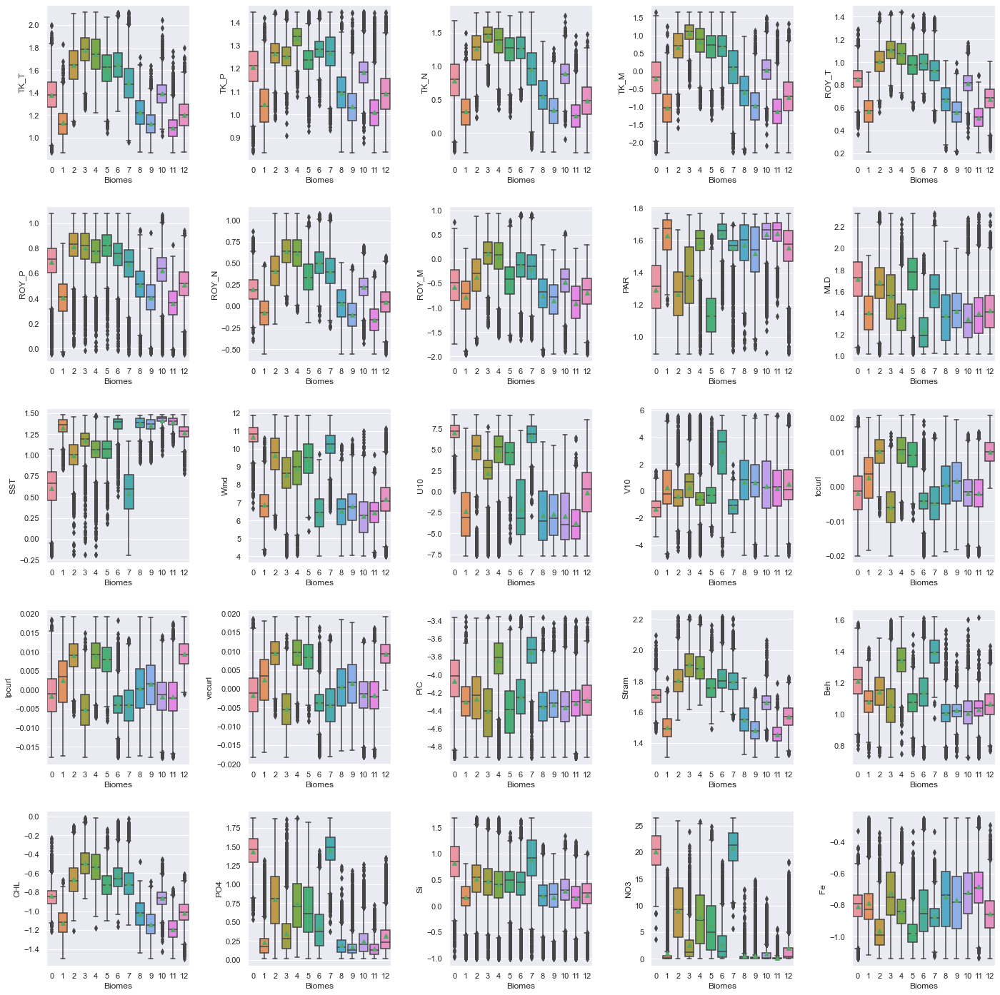

In [197]:
fig, axes = plt.subplots(5, 5, figsize = (20, 20))
counter = 0

for ii in range(5):
    for jj in range(5):
        if counter < 26:
            sns.boxplot(
                ax = axes[ii][jj],
                data = df1,
                y = df1.columns[counter],
                x = "Biomes", showmeans = True
            )
            counter = counter + 1
plt.savefig("kMeans_13clusters_coords.png", facecolor = 'white')
fig.tight_layout(pad = 3.0)

**Observations:**
Cluster1:


In [213]:
# # attach lat and lon again
# print(df1.shape[0] - df_PCA.shape[0]) # 0 means that the len is the same
# # df_PCA.head()
# extracted_coords = df_PCA[["Lon","Lat"]]
# extracted_coords.shape
# # df1 = df1.join(extracted_coords[["Lon","Lat"]])
# df1.head()

0


,TK_T,TK_P,TK_N,TK_M,ROY_T,ROY_P,ROY_N,ROY_M,PAR,MLD,SST,Wind,U10,V10,tccurl,lpcurl,vecurl,PIC,Stram,Beh,CHL,PO4,Si,NO3,Fe,Lon,Lat,Month_v_Apr,Month_v_Aug,Month_v_Dec,Month_v_Feb,Month_v_Jan,Month_v_Jul,Month_v_Jun,Month_v_Mar,Month_v_May,Month_v_Nov,Month_v_Oct,Month_v_Sep,Biomes
222,1.807109,1.209042,1.511413,1.190048,1.003292,0.795841,0.465322,-0.042359,0.915611,1.207457,0.653888,10.707553,2.286434,0.141652,0.016315,0.014738,0.014875,-3.933678,1.828014,1.016810,-0.568176,1.776478,1.360833,15.983999,-0.984984,2,43,0,0,0,0,1,0,0,0,0,0,0,0,2
225,1.708600,1.118688,1.399838,1.109536,1.142152,0.914113,0.685439,-0.086106,0.968912,1.283374,0.799616,11.275903,4.706937,0.318891,0.015146,0.014050,0.013959,-4.838632,1.942999,1.036154,-0.471036,1.323958,1.264313,11.444828,-0.912201,2,46,0,0,0,0,1,0,0,0,0,0,0,0,2
226,1.777858,1.211736,1.479350,1.131043,1.176018,1.031504,0.555949,-0.188393,1.014571,1.323847,0.841422,11.526707,5.436304,0.346983,0.013539,0.012664,0.012571,-4.725852,1.900257,1.000478,-0.519590,1.153387,1.232119,9.997232,-0.924594,2,47,0,0,0,0,1,0,0,0,0,0,0,0,2
227,1.713005,1.168160,1.396340,1.079387,0.993804,0.652824,0.459878,0.394301,1.051322,1.162400,0.946894,11.775187,5.681990,0.297312,0.010119,0.009489,0.009422,-4.431798,1.892094,1.004980,-0.507195,0.990984,1.194693,8.691362,-0.871455,2,48,0,0,0,0,1,0,0,0,0,0,0,0,2
231,1.695308,1.275447,1.358513,0.897288,1.009220,0.756389,0.442519,0.239938,1.128580,1.345211,1.103393,11.636938,6.157623,0.524768,0.003895,0.003629,0.003655,-4.560667,1.853393,1.117355,-0.550628,0.529655,1.050020,4.634119,-1.006077,2,52,0,0,0,0,1,0,0,0,0,0,0,0,2


In [215]:
# !pip install cartopy
# import cartopy.crs as ccrs
# import cartopy.feature as cfeature

     ---------------------------------------- 10.9/10.9 MB 9.3 MB/s eta 0:00:00
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
     ---------------------------------------- 46.5/46.5 kB 2.4 MB/s eta 0:00:00
     ---------------------------------------- 1.3/1.3 MB 20.8 MB/s eta 0:00:00

  error: subprocess-exited-with-error
  
  exit code: 1
  
  [286 lines of output]
  <string>:90: UserWarning: Unable to determine GEOS version. Ensure you have 3.7.2 or later installed, or installation may fail.
  running bdist_wheel
  running build
  running build_py
  creating build
  creating build\lib.win-amd64-cpython-310
  creating build\lib.win-amd64-cpython-310\cartopy
  copying lib\cartopy\crs.py -> build\lib.win-amd64-cpython-310\cartopy
  copying lib\cartopy\geodesic.py -> build\lib.win-amd64-cpython-310\cartopy
  copying lib\cartopy\img_transform.py -> build\lib.win-amd64-cpython-310\cartopy
  copying lib\cartopy\util.py -> build\lib.win-amd64-cpython-310\cartopy
  copying lib\cartopy\vector_transform.py -> build\lib.win-amd64-cpython-310\cartopy
  copying lib\cartopy\_epsg.py -> build\lib.win-amd64-cpython-310\cartopy
  copying lib\cartopy\_version.py -> build\lib.win-amd64-cpython-310\cartopy
  copying lib\cartopy\__init__.py -> build\lib.win-amd64-cpython-310\cartopy
  


Failed to build cartopy


  copying lib\cartopy\mpl\geocollection.py -> build\lib.win-amd64-cpython-310\cartopy\mpl
  copying lib\cartopy\mpl\gridliner.py -> build\lib.win-amd64-cpython-310\cartopy\mpl
  copying lib\cartopy\mpl\patch.py -> build\lib.win-amd64-cpython-310\cartopy\mpl
  copying lib\cartopy\mpl\slippy_image_artist.py -> build\lib.win-amd64-cpython-310\cartopy\mpl
  copying lib\cartopy\mpl\style.py -> build\lib.win-amd64-cpython-310\cartopy\mpl
  copying lib\cartopy\mpl\ticker.py -> build\lib.win-amd64-cpython-310\cartopy\mpl
  copying lib\cartopy\mpl\__init__.py -> build\lib.win-amd64-cpython-310\cartopy\mpl
  creating build\lib.win-amd64-cpython-310\cartopy\tests
  copying lib\cartopy\tests\conftest.py -> build\lib.win-amd64-cpython-310\cartopy\tests
  copying lib\cartopy\tests\test_coastline.py -> build\lib.win-amd64-cpython-310\cartopy\tests
  copying lib\cartopy\tests\test_coding_standards.py -> build\lib.win-amd64-cpython-310\cartopy\tests
  copying lib\cartopy\tests\test_crs.py -> build\lib.

**TRYING DBSCAN**

In [86]:
from sklearn.cluster import DBSCAN
df_db = df1.copy()
df_db.head()
df_db = df_db.drop(['Biomes','Lat','Lon'], axis=1)
df_db.head()

,TK_T,TK_P,TK_N,TK_M,ROY_T,ROY_P,ROY_N,ROY_M,PAR,MLD,SST,Wind,U10,V10,tccurl,lpcurl,vecurl,PIC,Stram,Beh,CHL,PO4,Si,NO3,Fe,Month_v_Apr,Month_v_Aug,Month_v_Dec,Month_v_Feb,Month_v_Jan,Month_v_Jul,Month_v_Jun,Month_v_Mar,Month_v_May,Month_v_Nov,Month_v_Oct,Month_v_Sep
225,1.708600,1.118688,1.399838,1.109536,1.142152,0.914113,0.685439,-0.086106,0.968912,1.283374,0.799616,11.275903,4.706937,0.318891,0.015146,0.014050,0.013959,-4.838632,1.942999,1.036154,-0.471036,1.323958,1.264313,11.444828,-0.912201,0,0,0,0,1,0,0,0,0,0,0,0
226,1.777858,1.211736,1.479350,1.131043,1.176018,1.031504,0.555949,-0.188393,1.014571,1.323847,0.841422,11.526707,5.436304,0.346983,0.013539,0.012664,0.012571,-4.725852,1.900257,1.000478,-0.519590,1.153387,1.232119,9.997232,-0.924594,0,0,0,0,1,0,0,0,0,0,0,0
285,1.703755,1.133409,1.360488,1.146860,0.514426,0.412716,-0.277232,-0.811344,1.682019,1.283719,1.472230,5.724634,-3.506938,0.886475,-0.006151,-0.005775,-0.005288,-3.634513,1.485720,1.064708,-1.221975,0.224104,0.356020,0.391093,-0.719048,0,0,0,0,1,0,0,0,0,0,0,0
286,1.440334,1.167723,1.011260,0.412809,0.475667,0.224148,-0.092177,-0.296115,1.700821,1.274203,1.465219,5.961529,-3.968511,1.177341,-0.004456,-0.004511,-0.004138,-3.794256,1.500235,1.152919,-1.173917,0.233343,0.321000,0.385426,-0.701927,0,0,0,0,1,0,0,0,0,0,0,0
287,1.218866,1.086106,0.603581,-0.461312,0.525353,0.250510,0.104051,-0.521026,1.719755,1.262355,1.456412,6.075997,-4.286039,1.346720,-0.001567,-0.001591,-0.001483,-4.178273,1.502426,1.147978,-1.091213,0.231516,0.293866,0.401094,-0.681359,0,0,0,0,1,0,0,0,0,0,0,0


In [108]:
dbscan = DBSCAN(eps=5, min_samples = 20)
labels = dbscan.fit_predict(df1)

In [109]:
clust = np.unique(labels)
print(clust)

[-1  0  1  2  3  4  5  6  7  8]


**-1 is not a cluster - it is noise. If -1 is not present, that means the algorithm didn't detect noises**

In [115]:
mlbl = np.max(labels)
mlbl

8

In [90]:
# Adding DBSCAN cluster labels to the original dataframes
dbscan = dbscan.labels_
df1["Biomes"] = kmeans.labels_
df1.head()

TypeError: 'DBSCAN' object does not support item assignment

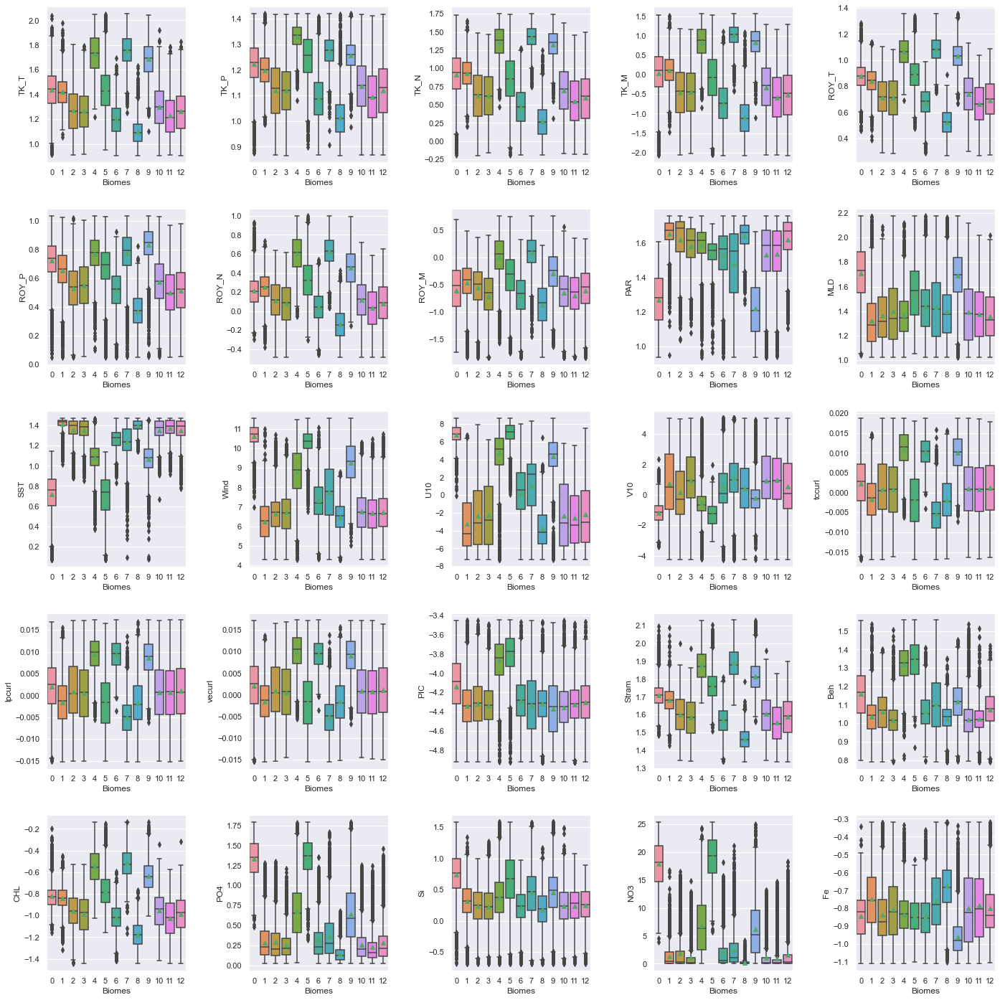

In [62]:
ccolors = ['black','blue','yellow','red','green','pink','brown','purple','silver','orange','beige','teal']

fig, axes = plt.subplots(5, 5, figsize = (20, 20))
counter = 0

for ii in range(5):
    for jj in range(5):
        if counter < 26:
            sns.boxplot(
                ax = axes[ii][jj],
                data = df1,
                y = df1.columns[counter],
                x = "Biomes", showmeans = True
            )
            counter = counter + 1
plt.savefig("dbscan_clusters_coords.png", facecolor = 'white')
fig.tight_layout(pad = 3.0)

# for i in clust:
#     plt.scatter(df1.iloc[labels == i,0], df[labels == i,1], s=10,c=ccolor[i])
#     plt.show